Some work to try and work out how to best stitch together different scans

In [1]:
import NavigatingTheMatrix as nvm
import numpy as np
from matplotlib import pyplot as plt
from pathlib import Path
import os
import cv2
from scipy.stats import mode

from icecream import ic

from scipy import signal

In [61]:
# Load 2 scans that we know have an overlap

# load desired matrix file and make an STM object from NavigatingTheMatrix file
cwd = Path.cwd() # current working directory

#path1 = cwd / 'hainault_examples' / '20200212-183707_Hainault-Si(001)-H--38_1.Z_mtrx'
path2 = cwd / 'hainault_examples' / '20200212-183707_Hainault-Si(001)-H--54_1.Z_mtrx'

#mtrx_scan1 = nvm.STM( str(path1) , None, None, None, standard_pix_ratio=512/100)
mtrx_scan2 = nvm.STM( str(path2) , None, None, None, standard_pix_ratio=1024/100) 

Pixel to nm ratio is 38pixels for every 100nm in the  trace down
trace down scan was interupted before completion. It will not be used.
Pixel to nm ratio is 38pixels for every 100nm in the  retrace down
retrace down scan was interupted before completion. It will not be used.


In [7]:
# clean up the scans

mtrx_scan1.clean_up(mtrx_scan1.trace_up, 'trace up', plane_level=True)
mtrx_scan1.clean_up(mtrx_scan1.retrace_up, 'retrace up', plane_level=True)

mtrx_scan1.clean_up(mtrx_scan1.trace_down, 'trace down', plane_level=True)
mtrx_scan1.clean_up(mtrx_scan1.retrace_down, 'retrace down', plane_level=True)

In [62]:
mtrx_scan2.clean_up(mtrx_scan2.trace_up, 'trace up', plane_level=True)
mtrx_scan2.clean_up(mtrx_scan2.retrace_up, 'retrace up', plane_level=True)


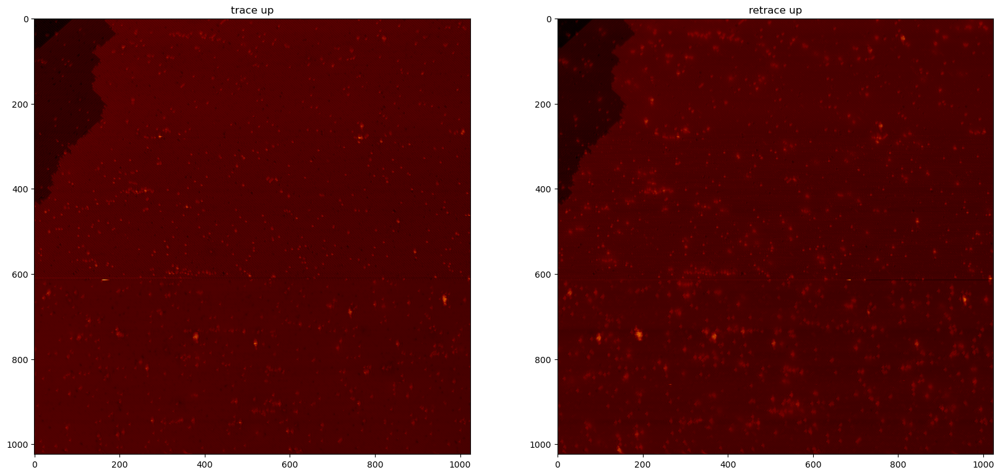

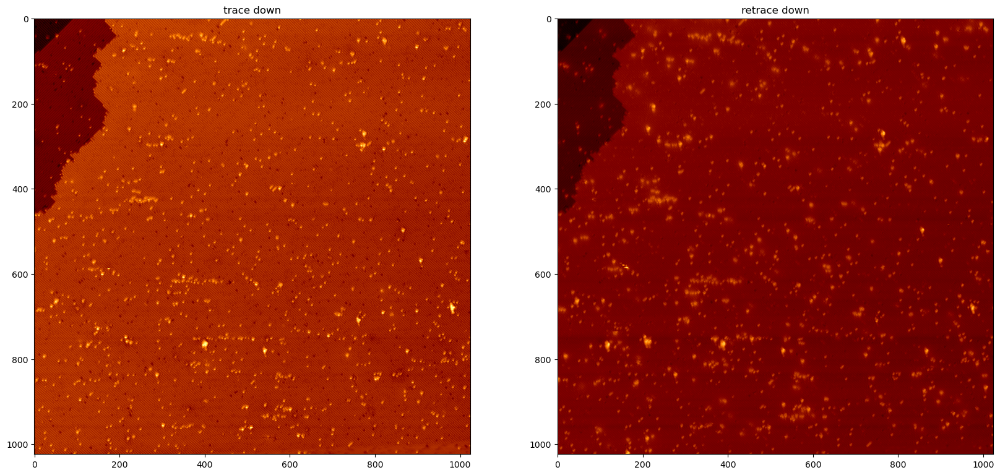

In [9]:
# plot the cleaned up scans and choose whether to use trace up or down
# (Viewing with gwyddion provides better quality images for inspection in my opinion)

fig, ax = plt.subplots(1,2, figsize=(20,15))
ax[0].imshow(mtrx_scan1.trace_up_proc, cmap='afmhot')
ax[0].set_title('trace up')
ax[1].imshow(mtrx_scan1.retrace_up_proc, cmap='afmhot')
ax[1].set_title('retrace up')
plt.show()

fig, ax = plt.subplots(1,2, figsize=(20,15))
ax[0].imshow(mtrx_scan1.trace_down_proc, cmap='afmhot')
ax[0].set_title('trace down')
ax[1].imshow(mtrx_scan1.retrace_down_proc, cmap='afmhot')
ax[1].set_title('retrace down')
plt.show()

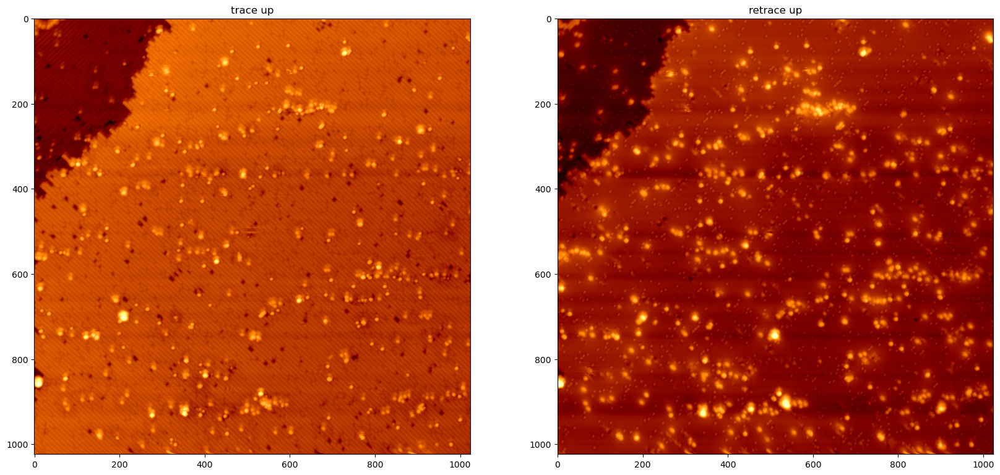

In [63]:
fig, ax = plt.subplots(1,2, figsize=(20,15))
ax[0].imshow(mtrx_scan2.trace_up_proc, cmap='afmhot')
ax[0].set_title('trace up')
ax[1].imshow(mtrx_scan2.retrace_up_proc, cmap='afmhot')
ax[1].set_title('retrace up')
plt.show()

In [67]:
n = 1
#scan1 = mtrx_scan1.trace_down_proc[::n,::n]
scan2 = mtrx_scan2.trace_up_proc#[:512,180:180+512]
scan2 = scan2[::n,::n]
#scan3 = mtrx_scan1.trace_down_proc[150:150+512,50:50+512]
#scan4 = mtrx_scan1.trace_down_proc[512:1024,:512]
#scan5 = mtrx_scan1.trace_down_proc[400:400+512,300:300+512]



In [2]:
# make a dictoinary of the scans you want to stitch

scans = {}

dir_path = r'C:\Users\nkolev\OneDrive - University College London\Desktop\mtrx\2022-10-06'

# Loop through the files in the directory and open the ones that are 63_1 to 99_1
# loading all 36 scans takes 10 minutes... so just load 10 for now.
# use a pair of ints as the key. There are 6X6 scans in total in this ~1um square
# each pair of ints corresponds to a scan in an intuitive way. (0,0) is the bottom left scan, (5,5) is the top right scan etc
for filename in os.listdir(dir_path):
    if filename[-8:] == '1.Z_mtrx':
        scan_number = int(filename[-11:-9])
        if scan_number<100 and scan_number>61:
            file_path = os.path.join(dir_path, filename)
            if os.path.isfile(file_path):
                # Add the file to the dictionary
                n = scan_number-62
                n1 = n//6
                n2 = n%6
                scans[(n1,n2)] = nvm.STM( str(file_path) , None, None, None, standard_pix_ratio=512/100)


In [42]:
# load the large overview scan

overview_path = r'C:\Users\nkolev\OneDrive - University College London\Desktop\mtrx\2022-10-10\20221010-161204_India-Si(001)-H-STM_AtomManipulation--7_3.Z_mtrx'

overview = nvm.STM( overview_path , None, None, None, standard_pix_ratio=512/1000)


Pixel to nm ratio is 1pixels for every 1000nm in the  trace down
trace down scan was interupted before completion. It will not be used.
Pixel to nm ratio is 1pixels for every 1000nm in the  retrace down
retrace down scan was interupted before completion. It will not be used.


In [162]:
# clean up the overview scan

overview.clean_up(overview.retrace_up, 'retrace up', plane_level=True)

In [13]:
# tidy up the scans (trace up only)

for scan in scans.values():
    scan.clean_up(scan.trace_up, 'trace up', plane_level=True)
    scan.clean_up(scan.retrace_up, 'retrace up', plane_level=True)
    scan.clean_up(scan.trace_down, 'trace down', plane_level=True)
    scan.clean_up(scan.retrace_down, 'retrace down', plane_level=True)



In [8]:
find_homography(scans[(0,1)].retrace_up_proc, overview.trace_up_proc, show_plot=True, threshold = 1)

NameError: name 'find_homography' is not defined

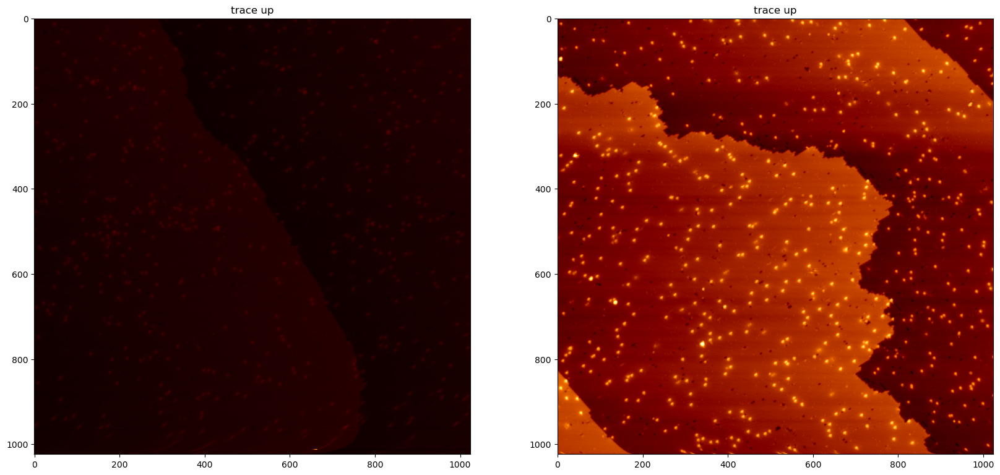

In [153]:
# plot a few to check they are all good

fig, ax = plt.subplots(1,2, figsize=(20,15))
ax[0].imshow(scans[(0,0)].retrace_up_proc, cmap='afmhot')
ax[0].set_title('trace up')
ax[1].imshow(scans[(0,1)].retrace_up_proc, cmap='afmhot')
ax[1].set_title('trace up')
plt.show()

In [326]:
def translation_check(H, mask, good, kpts1, kpts2, MatchesMask):
    '''
    Removes any matches that do not give the same translation as the mode of the translations of all matches from the same homography.
    This is done by rounding the translations to the nearest 5 and then taking the mode of the translations.
    args:
        good: list of matches
        MatchesMask: list of matches that were used for the homography
    returns:
        H: the new homography matrix
        mask: the mask of the matches that were used for the
    '''        
    translations = {}
    # remove the matches that weren't used for this homography 
    # store in list just for this check
    ids = np.where(np.array(MatchesMask)==0)[0].astype(int)
    trans_good = list(np.array(good)[ids])
       
    for m in trans_good:
        x1, y1 = kpts1[m.queryIdx].pt
        x2, y2 = kpts2[m.trainIdx].pt
        n = 20 # round to nearest 20
        trans = [n* round((x1-x2)/n), n* round((y1-y2)/n)]
        translations[m] = trans
    mode_ = mode(np.array(list(translations.values())))[0]
    #print(np.array(list(translations.values())).shape, mode_, mode_.shape)
    # remove matches that dont give translation=mode
    print(mode_.size)
    if mode_.size>3:
        ids = np.where(np.array(list(translations.values()))==mode_)[0].astype(int)
    #print(ids.size, len(good), mode_, translations)
  #  if ids.size != len(good):
        trans_good = list(np.array(trans_good)[ids])
    # recalculate the homography matrix
        src_pts = np.float32([kpts1[m.queryIdx].pt for m in trans_good]).reshape(-1, 1, 2)
        dst_pts = np.float32([kpts2[m.trainIdx].pt for m in trans_good]).reshape(-1, 1, 2)

        H, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5, confidence = 0.995) 
        good = trans_good
    
    return H, mask, good
    
    

In [520]:
# ideas on how to improve:
# 1) implement a cross-checker on the flann matcher
# 3) Pretend scans are jumbled up and you don't know their order. For each scan find top n scans that seem to overlap, and then get their homography matrix. 
#    Then do checks on these homogpraphy matrices to see if they make sense (e.g conserve orientation, scale etc)
# 4) Could use some of the real physical information we have to make it more accurate. E.g. we know the scans are of the same area.
#    We technically know the rough translation between the scans.
# 5) Try MSC on the translations to get rid of the bad ones.

def find_homography(img1, img2, threshold = 1, algorithm = 'SIFT', show_plot = False):
    '''
    Finds the homography matrix needed to align scan1 and scan2. 
    It first find common points between the two scans using SIFT, then uses RANSAC to get rid of the bad matches 
    and find the homography matrix.

    Args:
    img1 (numpy.ndarray): First scan. If one scans smaller than the other (in nm), this should be the smaller scan for better results.
    img2 (numpy.ndarray): Second scan
    threshold (float): Threshold for the Lowe's ratio test. Default is 0.8
    show_plot (bool): Whether to plot the matches and the homography transformation
    algorithm (str): Which algorithm to use for feature matching. 'SIFT' or 'AKAZE' only
    
    returns:
    H (numpy.ndarray): Homography matrix
    mask (numpy.ndarray): Mask of inliers
    '''

    # max/min normalise the images
    img1 = (img1 - np.min(img1))/(np.max(img1)-np.min(img1))
    img2 = (img2 - np.min(img2))/(np.max(img2)-np.min(img2))

    # change their resolution to the same
   # if img1.shape != img2.shape:
   #     img1 = cv2.resize(img1, (img2.shape[1], img2.shape[0]))
                                     
    # we need to use the OpenCV SIFT algorithm which needs the scan in a certain format
    sift_scan1 = cv2.normalize(img1, None, 0, 255, cv2.NORM_MINMAX).astype('uint8')
    sift_scan2 = cv2.normalize(img2, None, 0, 255, cv2.NORM_MINMAX).astype('uint8')

    if algorithm == 'SIFT':
        # Create SIFT object
        sift = cv2.SIFT_create(contrastThreshold=0.00001, edgeThreshold=10000) 
        #sift = cv2.SIFT_create()#contrastThreshold=01, edgeThreshold=10000) 
       
        # Find keypoints and descriptors
        kp1, des1 = sift.detectAndCompute(sift_scan1, None)
        kp2, des2 = sift.detectAndCompute(sift_scan2, None)

        FLANN_INDEX_KDTREE = 1
        index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=10)
        search_params = dict(checks=50)
        
        flann = cv2.FlannBasedMatcher(index_params, search_params)
        matches1to2 = flann.knnMatch(des1, des2, k=2)
        matches2to1 = flann.knnMatch(des2, des1, k=2)

    elif algorithm == 'AKAZE':
        # Create AKAZE object
        akaze = cv2.AKAZE_create()
        # Find keypoints and descriptors
        kp1, des1 = akaze.detectAndCompute(sift_scan1, None)
        kp2, des2 = akaze.detectAndCompute(sift_scan2, None)
        
        matcher = cv2.DescriptorMatcher_create(cv2.DescriptorMatcher_BRUTEFORCE_HAMMING)
        matches1to2 = matcher.knnMatch(des1, des2, k=2)
        matches2to1 = matcher.knnMatch(des2, des1, k=2)
    
    else: 
        raise ValueError('algorithm should be either SIFT or AKAZE')

    # First filter: store all the good matches as per Lowe's ratio test
    good1to2 = []
    for m, n in matches1to2:
        if m.distance < threshold * n.distance:
            good1to2.append(m)

    good2to1 = []
    for m, n in matches2to1:
        if m.distance < threshold * n.distance:
            good2to1.append(m)

    # Cross-check: keep only matches that appear in both directions
    good = []
    for m1 in good1to2:
        for m2 in good2to1:
            if m1.queryIdx == m2.trainIdx and m1.trainIdx == m2.queryIdx:
                good.append(m1)
                break

    # draw matches
    #if show_plot:
    #    plot = cv2.drawMatches(sift_scan1, kp1, sift_scan2, kp2, matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
    #    plt.imshow(plot, cmap='afmhot')
    #    plt.title('All matches')
    #    plt.show()

    # first filter
    # store all the good matches as per Lowe's ratio test.
    # i.e. each match has two points its matched with. If the second point is much further than the first
    # (in terms of their feature vectors), then the first match isn't ambiguous and should be kept.
  #  good = []
  #  for m,n in matches:
  #      good.append(m)

    # draw matches
    if show_plot:
        plot = cv2.drawMatches(sift_scan1, kp1, sift_scan2, kp2, good, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
        plt.imshow(plot, cmap='afmhot')
        plt.title('All matches')
        plt.show()

  #  good = []
  #  for m,n in matches:
  #      if m.distance < threshold*n.distance:
  #          good.append(m)


    # Second filter: check the translation between the scans given by each match. 
    # Find matches that give similar translations (around 5 or 10 pixels difference in each direction)
    translations = {}
    for m in good:  
        x1, y1 = kp1[m.queryIdx].pt
        x2, y2 = kp2[m.trainIdx].pt
        trans = [(x1-x2),(y1-y2)]
        translations[m] = trans
    #print(len(good))
    # delete matches that don't have a similar translation to any other matches
    array_trans = np.array(list(translations.values()))
    for m, trans in translations.items():
        d_trans = np.abs( array_trans - trans )
        # find number of translations within 10 pixels
        n_tenpix = np.sum(d_trans < 20, axis = 1)
        n_tenpix = np.sum(n_tenpix == 2)
        if n_tenpix < 10: 
            good.remove(m) 

    # draw matches
    if show_plot:
        plot = cv2.drawMatches(sift_scan1, kp1, sift_scan2, kp2, good, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
        plt.imshow(plot, cmap='afmhot')
        plt.title('Clusters of matches with similar translations')
        plt.show()
 
    # find keypoints in image 2 that have multiple matches in image 1 and keep only the best one
    repeated_kps = {}
    for m in good:
        if m.trainIdx not in repeated_kps:
            repeated_kps[m.trainIdx] = [m]
        else:
            repeated_kps[m.trainIdx].append(m)
    
    # Sort the repeated_kps and keep only the best match
    for k, v in repeated_kps.items():
        repeated_kps[k] = sorted(v, key=lambda x: x.distance)

    # Remove all but the best match
    unique_good = []
    for k, v in repeated_kps.items():
        unique_good.append(v[0])  # Keep only the best match
    
    if len(unique_good)<4:
        print("Not enough matches found to compute homography matrix")
        return("Not enough matches found to compute homography matrix")

    # use Ransac to get rid of more bad matches
    src_pts = np.float32([kp1[m.queryIdx].pt for m in unique_good]).reshape(-1, 1, 2)
    dst_pts = np.float32([kp2[m.trainIdx].pt for m in unique_good]).reshape(-1, 1, 2)

    H, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, ransacReprojThreshold=1, maxIters=5000, confidence = 0.995)

    matchesMask = mask.ravel().tolist()

    h,w = sift_scan1.shape
    pts = np.float32([ [0,0],[0,h-1],[w-1,h-1],[w-1,0] ]).reshape(-1,1,2)
    dst = cv2.perspectiveTransform(pts,H)
    if show_plot:
        plot2 = cv2.polylines(np.copy(sift_scan2),[np.int32(dst)],True,255,3, cv2.LINE_AA)
        draw_params = dict(matchColor = (0,255,0), # draw matches in green color
                   singlePointColor = None,
                   matchesMask = matchesMask, # draw only inliers
                   flags = 2)
        plot3 = cv2.drawMatches(sift_scan1,kp1, plot2, kp2, unique_good ,None,**draw_params)
        plt.imshow(plot3, cmap='afmhot'), plt.title('First homography matches'), plt.show()

    ###########################################
    # Now we have a homography matrix let's do some tests on it and the matches it uses
    # to try and get a more accurate one.

    # delete any matches that give a translation that's very different from the mode
    H, trans_mask, translation_good = translation_check(H, mask, unique_good.copy(), kp1, kp2, matchesMask)
    trans_matchesMask = trans_mask.ravel().tolist()
    if show_plot:
        plot2 = cv2.polylines(np.copy(sift_scan2),[np.int32(dst)],True,255,3, cv2.LINE_AA)
        draw_params = dict(matchColor = (0,255,0), # draw matches in green color
                   singlePointColor = None,
                   matchesMask = trans_matchesMask, # draw only inliers
                   flags = 2)
        plot3 = cv2.drawMatches(sift_scan1,kp1, plot2, kp2, translation_good, None,**draw_params)
        plt.imshow(plot3, cmap='afmhot'), plt.title('Homography matches'), plt.show()


    '''
# NOTE: HOW DOES DELETING MATCHES FROM THE MATCHES LIST AFFECT THE MASK?

    # now carry out some tests on the homography matrix to see if it makes sense
    # it should conserve orientation (scan should not be mirrored)
    # rotation should be no more than 30 degrees (hand picked parameter, could change)
    
    # orientation
    # determinant of top left 2x2 matrix should be positive
    det = (H[0,0]*H[1,1])-(H[0,1]*H[1,0])
    ic(det)
    while det<=0:
        # remove the matches that were used for this homography and calculate it again
        ids = np.where(np.array(matchesMask)==0)[0].astype(int)
        unique_good = list(np.array(unique_good)[ids])
        
        if len(unique_good)<4: # check there's still enough matches to find matrix
            print("Not enough matches found to compute homography matrix")
            return("Not enough matches found to compute homography matrix")
        
        # recalculate the homography matrix
        src_pts = np.float32([kp1[m.queryIdx].pt for m in unique_good]).reshape(-1, 1, 2)
        dst_pts = np.float32([kp2[m.trainIdx].pt for m in unique_good]).reshape(-1, 1, 2)
        H, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5, confidence = 0.995)
        matchesMask = mask.ravel().tolist()
        # delete any matches that give a translation that's very different from the mode
       # H, trans_mask, translation_good = translation_check(H, mask, unique_good.copy(), kp1, kp2, matchesMask)
        det = (H[0,0]*H[1,1])-(H[0,1]*H[1,0])
        ic(det)
        #trans_matchesMask = trans_mask.ravel().tolist()
        if show_plot:
            plot2 = cv2.polylines(np.copy(sift_scan2),[np.int32(dst)],True,255,3, cv2.LINE_AA)
            draw_params = dict(matchColor = (0,255,0), # draw matches in green color
                    singlePointColor = None,
                    matchesMask = matchesMask, # draw only inliers
                    flags = 2)
            plot3 = cv2.drawMatches(sift_scan1,kp1, plot2, kp2, good, None,**draw_params)
            plt.imshow(plot3, cmap='afmhot'), plt.title('Homography matches'), plt.show()
    
    # rotation
    # take 2 points and see how much they are rotated
    # if the rotation is more than 30 degrees, then the homography matrix is probably wrong
    point1 = np.array([0,1,1])
    point2 = np.array([0,0,1])
    point1_rot = np.dot(H,point1)
    point2_rot = np.dot(H,point2)
    vec = point1[:2]-point2[:2]
    vec_rot = point1_rot[:2] - point2_rot[:2]
    # find angle between vec and vec_rot
    angle = np.arccos(np.dot(vec, vec_rot)/(np.linalg.norm(vec)*np.linalg.norm(vec_rot)))
    angle = np.degrees(angle)
    ic(angle)
    while angle>20 or angle<-20:
        # get rid of the matches that were used for this homography and calculate it again
        ids = np.where(np.array(matchesMask)==0)[0].astype(int)
        unique_good = list(np.array(unique_good)[ids])

        if len(unique_good)<4:
            print("Not enough matches found to compute homography matrix")
            return("Not enough matches found to compute homography matrix")
        
        # recalculate the homography matrix
        src_pts = np.float32([kp1[m.queryIdx].pt for m in unique_good]).reshape(-1, 1, 2)
        dst_pts = np.float32([kp2[m.trainIdx].pt for m in unique_good]).reshape(-1, 1, 2)
        H, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5, confidence = 0.995)
        # delete any matches that give a translation that's very different from the mode
       # H, trans_mask, translation_good = translation_check(H, mask, unique_good.copy(), kp1, kp2, matchesMask)
      #  trans_matchesMask = mask.ravel().tolist()
        point1_rot = np.dot(H,point1)
        point2_rot = np.dot(H,point2)
        vec_rot = point1_rot[:2] - point2_rot[:2]
        angle = np.arccos(np.dot(vec, vec_rot)/(np.linalg.norm(vec)*np.linalg.norm(vec_rot)))
        angle = np.degrees(angle)
        ic(angle)
        if show_plot:
            plot2 = cv2.polylines(np.copy(sift_scan2),[np.int32(dst)],True,255,3, cv2.LINE_AA)
            draw_params = dict(matchColor = (0,255,0), # draw matches in green color
                    singlePointColor = None,
                    matchesMask = matchesMask, # draw only inliers
                    flags = 2)
            plot3 = cv2.drawMatches(sift_scan1,kp1, plot2, kp2, good, None,**draw_params)
            plt.imshow(plot3, cmap='afmhot'), plt.title('Homography matches'), plt.show()
    
    if show_plot:
        plot2 = cv2.polylines(np.copy(sift_scan2),[np.int32(dst)],True,255,3, cv2.LINE_AA)
        draw_params = dict(matchColor = (0,255,0), # draw matches in green color
                   singlePointColor = None,
                   matchesMask = matchesMask, # draw only inliers
                   flags = 2)
        plot3 = cv2.drawMatches(sift_scan1,kp1, plot2, kp2, unique_good ,None,**draw_params)
        plt.imshow(plot3, cmap='afmhot'), plt.title('Final homography matches'), plt.show()

    '''
    return H, mask

(0, 5) (0, 6)
(1, 0) (1, 1)


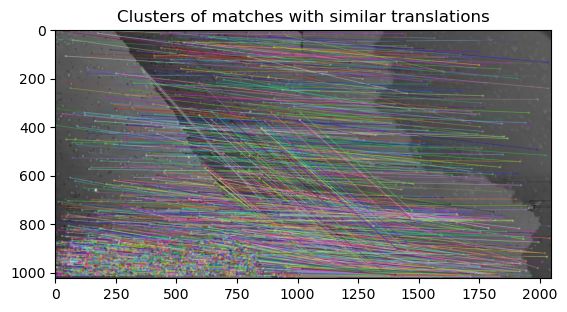

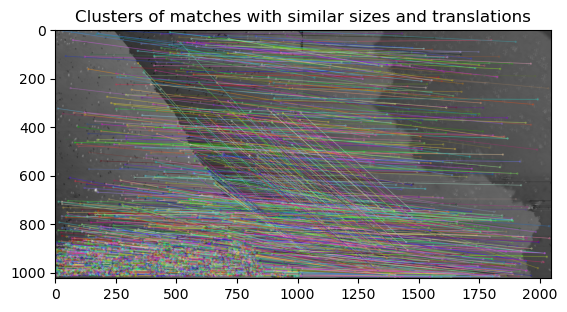

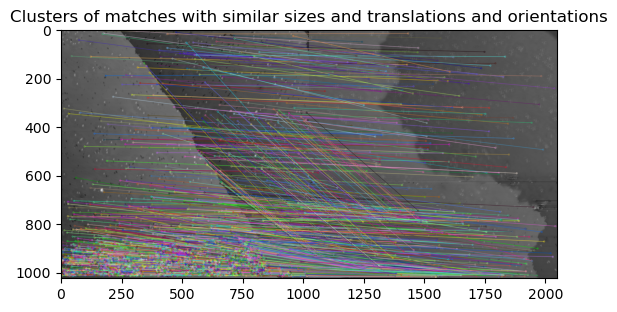

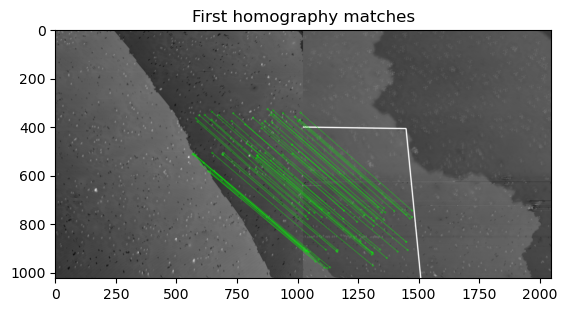

2


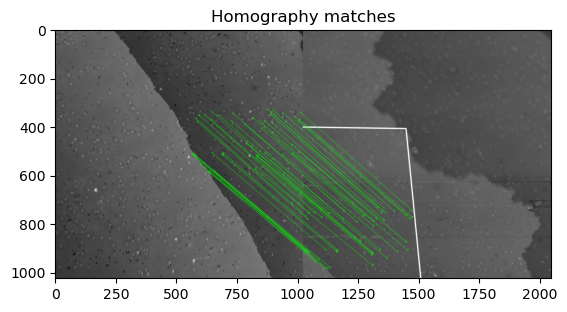

In [390]:
# Find overlaps and homography matrices. Start with (0,0) and (0,1), then (0,2) etc

homographies = {}

i=0
for key, scan in scans.items():
    if i==5:
        neighbour_key = (key[0], key[1]+1)
        print(key, neighbour_key)
        if neighbour_key[1]>5:
            continue
        if neighbour_key not in scans:
            continue
        neighbour = scans[neighbour_key]
        homographies[(key, neighbour_key)] = find_homography(scan.trace_up_proc, neighbour.trace_up_proc, threshold=1, show_plot=True)
    i+=1
#    if i==1:
#        break 

In [17]:
class scan_stitcher(object):
    '''
    A class used to stitch together STM scans.

    Attributes:


    Methods:
    find_homography: Finds the homography matrix needed to align scan1 and scan2.
    stitch_two_scans: Stitches together two images using the homography matrix.
    '''

    def __init__(self):
        pass

    def stitch_two_scans(self, img1, img2, H):
        # change their resolution to the same
        # Get the dimensions of the images
        h1, w1 = img1.shape[:2]
        h2, w2 = img2.shape[:2]
        #print(h1,w1,h2,w2) # seems fine
        # Get the canvas dimensions
        pts_img1 = np.float32([[0, 0], [0, h1], [w1, h1], [w1, 0]]).reshape(-1, 1, 2)
        pts_img2 = np.float32([[0, 0], [0, h2], [w2, h2], [w2, 0]]).reshape(-1, 1, 2)

        pts_img2_transformed = cv2.perspectiveTransform(pts_img2, H)
        #print(pts_img2_transformed)
        pts = np.concatenate((pts_img1, pts_img2_transformed), axis=0)
        [xmin, ymin] = np.int32(pts.min(axis=0).ravel() - 0.5)
        [xmax, ymax] = np.int32(pts.max(axis=0).ravel() + 0.5)

        # Translation matrix to shift the image
        translation_dist = [-xmin, -ymin]
        H_translation = np.array([[1, 0, translation_dist[0]], [0, 1, translation_dist[1]], [0, 0, 1]])
    # print(xmax - xmin, ymax - ymin)
        # Warp the second image
        result_img = cv2.warpPerspective(img2, H_translation.dot(H), (xmax - xmin, ymax - ymin))
        result_img[translation_dist[1]:h1 + translation_dist[1], translation_dist[0]:w1 + translation_dist[0]] = img1

        plt.imshow(result_img, cmap='afmhot')
        plt.title('Stitched image')
        plt.show()

        return result_img   

    def find_homography(self, img1, img2, threshold = 1, algorithm = 'SIFT', show_plot = False):
        '''
        Finds the homography matrix needed to align scan1 and scan2. 
        It first find common points between the two scans using SIFT, then uses RANSAC to get rid of the bad matches 
        and find the homography matrix.

        Args:
        img1 (numpy.ndarray): First scan. If one scans smaller than the other (in nm), this should be the smaller scan for better results.
        img2 (numpy.ndarray): Second scan
        threshold (float): Threshold for the Lowe's ratio test. Default is 0.8
        show_plot (bool): Whether to plot the matches and the homography transformation
        algorithm (str): Which algorithm to use for feature matching. 'SIFT' or 'AKAZE' only
        
        returns:
        H (numpy.ndarray): Homography matrix
        mask (numpy.ndarray): Mask of inliers
        '''

        # max/min normalise the images
        img1 = (img1 - np.min(img1))/(np.max(img1)-np.min(img1))
        img2 = (img2 - np.min(img2))/(np.max(img2)-np.min(img2))

        # change their resolution to the same
    # if img1.shape != img2.shape:
    #     img1 = cv2.resize(img1, (img2.shape[1], img2.shape[0]))
                                        
        # we need to use the OpenCV SIFT algorithm which needs the scan in a certain format
        sift_scan1 = cv2.normalize(img1, None, 0, 255, cv2.NORM_MINMAX).astype('uint8')
        sift_scan2 = cv2.normalize(img2, None, 0, 255, cv2.NORM_MINMAX).astype('uint8')

        if algorithm == 'SIFT':
            # Create SIFT object
            sift = cv2.SIFT_create(contrastThreshold=0.00001, edgeThreshold=10000) 
            #sift = cv2.SIFT_create()#contrastThreshold=01, edgeThreshold=10000) 
        
            # Find keypoints and descriptors
            kp1, des1 = sift.detectAndCompute(sift_scan1, None)
            kp2, des2 = sift.detectAndCompute(sift_scan2, None)

            FLANN_INDEX_KDTREE = 1
            index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=10)
            search_params = dict(checks=50)
            
            flann = cv2.FlannBasedMatcher(index_params, search_params)
            matches1to2 = flann.knnMatch(des1, des2, k=2)
            matches2to1 = flann.knnMatch(des2, des1, k=2)

        elif algorithm == 'AKAZE':
            # Create AKAZE object
            akaze = cv2.AKAZE_create()
            # Find keypoints and descriptors
            kp1, des1 = akaze.detectAndCompute(sift_scan1, None)
            kp2, des2 = akaze.detectAndCompute(sift_scan2, None)
            
            matcher = cv2.DescriptorMatcher_create(cv2.DescriptorMatcher_BRUTEFORCE_HAMMING)
            matches1to2 = matcher.knnMatch(des1, des2, k=2)
            matches2to1 = matcher.knnMatch(des2, des1, k=2)
        
        else: 
            raise ValueError('algorithm should be either SIFT or AKAZE')

        # First filter: store all the good matches as per Lowe's ratio test
        good1to2 = []
        for m, n in matches1to2:
            if m.distance < threshold * n.distance:
                good1to2.append(m)

        good2to1 = []
        for m, n in matches2to1:
            if m.distance < threshold * n.distance:
                good2to1.append(m)

        # Cross-check: keep only matches that appear in both directions
        good = []
        for m1 in good1to2:
            for m2 in good2to1:
                if m1.queryIdx == m2.trainIdx and m1.trainIdx == m2.queryIdx:
                    good.append(m1)
                    break

        # draw matches
        #if show_plot:
        #    plot = cv2.drawMatches(sift_scan1, kp1, sift_scan2, kp2, matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
        #    plt.imshow(plot, cmap='afmhot')
        #    plt.title('All matches')
        #    plt.show()

        # first filter
        # store all the good matches as per Lowe's ratio test.
        # i.e. each match has two points its matched with. If the second point is much further than the first
        # (in terms of their feature vectors), then the first match isn't ambiguous and should be kept.
    #  good = []
    #  for m,n in matches:
    #      good.append(m)

        # draw matches
        if show_plot:
            plot = cv2.drawMatches(sift_scan1, kp1, sift_scan2, kp2, good, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
            plt.imshow(plot, cmap='afmhot')
            plt.title('All matches')
            plt.show()

    #  good = []
    #  for m,n in matches:
    #      if m.distance < threshold*n.distance:
    #          good.append(m)


        # Second filter: check the translation between the scans given by each match. 
        # Find matches that give similar translations (around 5 or 10 pixels difference in each direction)
        translations = {}
        for m in good:  
            x1, y1 = kp1[m.queryIdx].pt
            x2, y2 = kp2[m.trainIdx].pt
            trans = [(x1-x2),(y1-y2)]
            translations[m] = trans
        #print(len(good))
        # delete matches that don't have a similar translation to any other matches
        array_trans = np.array(list(translations.values()))
        for m, trans in translations.items():
            d_trans = np.abs( array_trans - trans )
            # find number of translations within 10 pixels
            n_tenpix = np.sum(d_trans < 20, axis = 1)
            n_tenpix = np.sum(n_tenpix == 2)
            if n_tenpix < 10: 
                good.remove(m) 

        # draw matches
        if show_plot:
            plot = cv2.drawMatches(sift_scan1, kp1, sift_scan2, kp2, good, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
            plt.imshow(plot, cmap='afmhot')
            plt.title('Clusters of matches with similar translations')
            plt.show()
    
        # find keypoints in image 2 that have multiple matches in image 1 and keep only the best one
        repeated_kps = {}
        for m in good:
            if m.trainIdx not in repeated_kps:
                repeated_kps[m.trainIdx] = [m]
            else:
                repeated_kps[m.trainIdx].append(m)
        
        # Sort the repeated_kps and keep only the best match
        for k, v in repeated_kps.items():
            repeated_kps[k] = sorted(v, key=lambda x: x.distance)

        # Remove all but the best match
        unique_good = []
        for k, v in repeated_kps.items():
            unique_good.append(v[0])  # Keep only the best match
        
        if len(unique_good)<4:
            print("Not enough matches found to compute homography matrix")
            return None

        # use Ransac to get rid of more bad matches
        src_pts = np.float32([kp1[m.queryIdx].pt for m in unique_good]).reshape(-1, 1, 2)
        dst_pts = np.float32([kp2[m.trainIdx].pt for m in unique_good]).reshape(-1, 1, 2)

        H, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, ransacReprojThreshold=1, maxIters=5000, confidence = 0.995)

        matchesMask = mask.ravel().tolist()

        h,w = sift_scan1.shape
        pts = np.float32([ [0,0],[0,h-1],[w-1,h-1],[w-1,0] ]).reshape(-1,1,2)
        dst = cv2.perspectiveTransform(pts,H)
        if show_plot:
            plot2 = cv2.polylines(np.copy(sift_scan2),[np.int32(dst)],True,255,3, cv2.LINE_AA)
            draw_params = dict(matchColor = (0,255,0), # draw matches in green color
                    singlePointColor = None,
                    matchesMask = matchesMask, # draw only inliers
                    flags = 2)
            plot3 = cv2.drawMatches(sift_scan1,kp1, plot2, kp2, unique_good ,None,**draw_params)
            plt.imshow(plot3, cmap='afmhot'), plt.title('First homography matches'), plt.show()

        ###########################################
        # Now we have a homography matrix let's do some tests on it and the matches it uses
        # to try and get a more accurate one.

        # delete any matches that give a translation that's very different from the mode
      #  H, trans_mask, translation_good = translation_check(H, mask, unique_good.copy(), kp1, kp2, matchesMask)
      #  trans_matchesMask = trans_mask.ravel().tolist()
      #  if show_plot:
      #      plot2 = cv2.polylines(np.copy(sift_scan2),[np.int32(dst)],True,255,3, cv2.LINE_AA)
      #      draw_params = dict(matchColor = (0,255,0), # draw matches in green color
      #              singlePointColor = None,
      #              matchesMask = trans_matchesMask, # draw only inliers
      #              flags = 2)
      #      plot3 = cv2.drawMatches(sift_scan1,kp1, plot2, kp2, translation_good, None,**draw_params)
      #      plt.imshow(plot3, cmap='afmhot'), plt.title('Homography matches'), plt.show()


        '''
        # NOTE: HOW DOES DELETING MATCHES FROM THE MATCHES LIST AFFECT THE MASK?

        # now carry out some tests on the homography matrix to see if it makes sense
        # it should conserve orientation (scan should not be mirrored)
        # rotation should be no more than 30 degrees (hand picked parameter, could change)
        
        # orientation
        # determinant of top left 2x2 matrix should be positive
        det = (H[0,0]*H[1,1])-(H[0,1]*H[1,0])
        ic(det)
        while det<=0:
            # remove the matches that were used for this homography and calculate it again
            ids = np.where(np.array(matchesMask)==0)[0].astype(int)
            unique_good = list(np.array(unique_good)[ids])
            
            if len(unique_good)<4: # check there's still enough matches to find matrix
                print("Not enough matches found to compute homography matrix")
                return("Not enough matches found to compute homography matrix")
            
            # recalculate the homography matrix
            src_pts = np.float32([kp1[m.queryIdx].pt for m in unique_good]).reshape(-1, 1, 2)
            dst_pts = np.float32([kp2[m.trainIdx].pt for m in unique_good]).reshape(-1, 1, 2)
            H, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5, confidence = 0.995)
            matchesMask = mask.ravel().tolist()
            # delete any matches that give a translation that's very different from the mode
        # H, trans_mask, translation_good = translation_check(H, mask, unique_good.copy(), kp1, kp2, matchesMask)
            det = (H[0,0]*H[1,1])-(H[0,1]*H[1,0])
            ic(det)
            #trans_matchesMask = trans_mask.ravel().tolist()
            if show_plot:
                plot2 = cv2.polylines(np.copy(sift_scan2),[np.int32(dst)],True,255,3, cv2.LINE_AA)
                draw_params = dict(matchColor = (0,255,0), # draw matches in green color
                        singlePointColor = None,
                        matchesMask = matchesMask, # draw only inliers
                        flags = 2)
                plot3 = cv2.drawMatches(sift_scan1,kp1, plot2, kp2, good, None,**draw_params)
                plt.imshow(plot3, cmap='afmhot'), plt.title('Homography matches'), plt.show()
        
        # rotation
        # take 2 points and see how much they are rotated
        # if the rotation is more than 30 degrees, then the homography matrix is probably wrong
        point1 = np.array([0,1,1])
        point2 = np.array([0,0,1])
        point1_rot = np.dot(H,point1)
        point2_rot = np.dot(H,point2)
        vec = point1[:2]-point2[:2]
        vec_rot = point1_rot[:2] - point2_rot[:2]
        # find angle between vec and vec_rot
        angle = np.arccos(np.dot(vec, vec_rot)/(np.linalg.norm(vec)*np.linalg.norm(vec_rot)))
        angle = np.degrees(angle)
        ic(angle)
        while angle>20 or angle<-20:
            # get rid of the matches that were used for this homography and calculate it again
            ids = np.where(np.array(matchesMask)==0)[0].astype(int)
            unique_good = list(np.array(unique_good)[ids])

            if len(unique_good)<4:
                print("Not enough matches found to compute homography matrix")
                return("Not enough matches found to compute homography matrix")
            
            # recalculate the homography matrix
            src_pts = np.float32([kp1[m.queryIdx].pt for m in unique_good]).reshape(-1, 1, 2)
            dst_pts = np.float32([kp2[m.trainIdx].pt for m in unique_good]).reshape(-1, 1, 2)
            H, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5, confidence = 0.995)
            # delete any matches that give a translation that's very different from the mode
        # H, trans_mask, translation_good = translation_check(H, mask, unique_good.copy(), kp1, kp2, matchesMask)
        #  trans_matchesMask = mask.ravel().tolist()
            point1_rot = np.dot(H,point1)
            point2_rot = np.dot(H,point2)
            vec_rot = point1_rot[:2] - point2_rot[:2]
            angle = np.arccos(np.dot(vec, vec_rot)/(np.linalg.norm(vec)*np.linalg.norm(vec_rot)))
            angle = np.degrees(angle)
            ic(angle)
            if show_plot:
                plot2 = cv2.polylines(np.copy(sift_scan2),[np.int32(dst)],True,255,3, cv2.LINE_AA)
                draw_params = dict(matchColor = (0,255,0), # draw matches in green color
                        singlePointColor = None,
                        matchesMask = matchesMask, # draw only inliers
                        flags = 2)
                plot3 = cv2.drawMatches(sift_scan1,kp1, plot2, kp2, good, None,**draw_params)
                plt.imshow(plot3, cmap='afmhot'), plt.title('Homography matches'), plt.show()
        
        if show_plot:
            plot2 = cv2.polylines(np.copy(sift_scan2),[np.int32(dst)],True,255,3, cv2.LINE_AA)
            draw_params = dict(matchColor = (0,255,0), # draw matches in green color
                    singlePointColor = None,
                    matchesMask = matchesMask, # draw only inliers
                    flags = 2)
            plot3 = cv2.drawMatches(sift_scan1,kp1, plot2, kp2, unique_good ,None,**draw_params)
            plt.imshow(plot3, cmap='afmhot'), plt.title('Final homography matches'), plt.show()

        '''
        return H, mask
    
    def stitch_scans(self, scans, trace = 'trace up', threshold = 0.8):
        '''
        Stitches together a dictionary of scans. Starts by finding the homography matrix between the first two scans, then
        stitches the second scan to the first, then find homography matrix between the stitched scan and the third then stitches
        them together and so on.

        Args:
        scans (dict): Dictionary of scans with the keys being the row and column number of the scans and the values being the scans themselves.
                      The scans should be stm scan objects. What is row and column number? Imagine we split the total image into an nxn grid with n being
                      the number of scans taken in x and y direction. Then the row and column number is the position of the scan in this grid.
        trace (str): Which trace to use for the stitching. One of 'trace up', 'trace down', 'retrace up' or 'retrace down'. Default is 'trace up'.
        threshold (float): Threshold for the Lowe's ratio test during the matches filtering. Default is 0.8 
                
        Returns:
        stitched_scan (numpy.ndarray): The stitched scans
        '''
        
        # make a dictionary of the scans with the key being the row and column number of the scan
        # and the value being the scan itself as a numpy array
        scans_np = {}
        for key, scan in scans.items():
            if trace == 'trace up':
                scans_np[key] = scan.trace_up_proc
            elif trace == 'trace down':
                scans_np[key] = scan.trace_down_proc
            elif trace == 'retrace up':
                scans_np[key] = scan.retrace_up_proc
            elif trace == 'retrace down':
                scans_np[key] = scan.retrace_down_proc

        stitched_scan = scans_np[(0,0)]
        homographies = {} # store the homography matrices between each scan
        for key, scan in scans_np.items():
            neighbour_key = (key[0], key[1]+1)
            print(key, neighbour_key)
            if neighbour_key not in scans_np:
                continue
            neighbour = scans_np[neighbour_key]
            # get homography
            homographies[(key, neighbour_key)] = self.find_homography(stitched_scan, neighbour, threshold=1, show_plot=True)
            if homographies[(key, neighbour_key)] == None:
                print("No homography matrix found between", key, "and", neighbour_key)
                prompt = input("Do you want to continue? y/n")
                if prompt == 'n':
                    return stitched_scan
                else:
                    continue
            # stitch the old stitched scan with the new scan
            stitched_scan = self.stitch_two_scans(stitched_scan, neighbour, homographies[(key, neighbour_key)])
            
        return stitched_scan
        

In [18]:
# make a scan_stitcher object
ScanStitcher = scan_stitcher()

# stitch the scans
stitched_scan = ScanStitcher.stitch_scans(scans, threshold=1)

(0, 0) (0, 1)


1024 1024 1664 1435


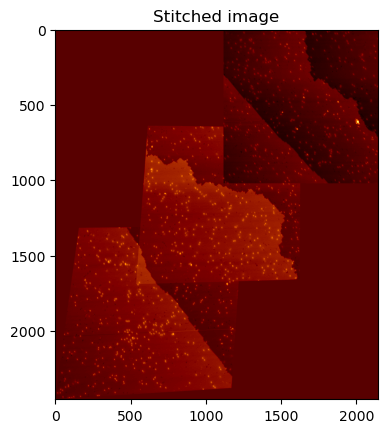

In [526]:
stitch3 = stitch_images(scans[(0,2)].retrace_down_proc.astype(np.float32), stitch1.astype(np.float32), homography1[0])

1024 1024 2455 2141


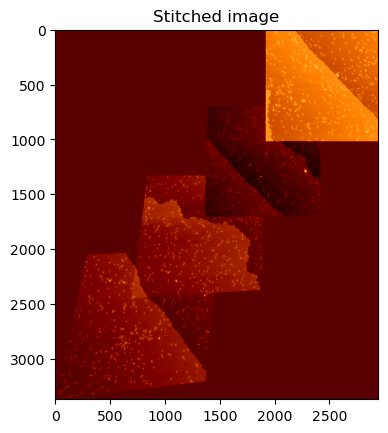

In [528]:
stitch4 = stitch_images(scans[(0,3)].retrace_down_proc.astype(np.float32), stitch3.astype(np.float32), homography2[0])

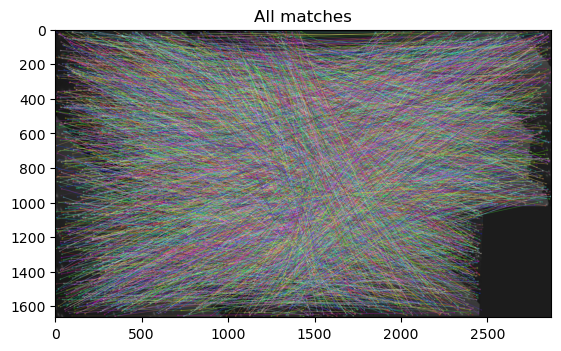

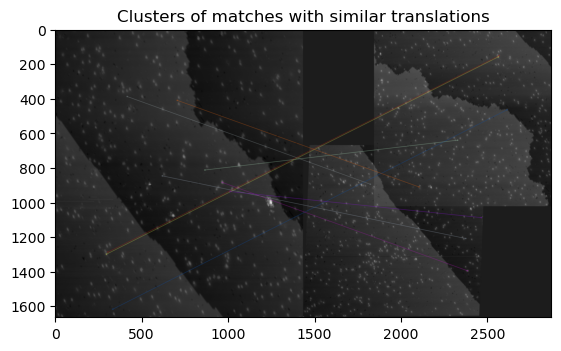

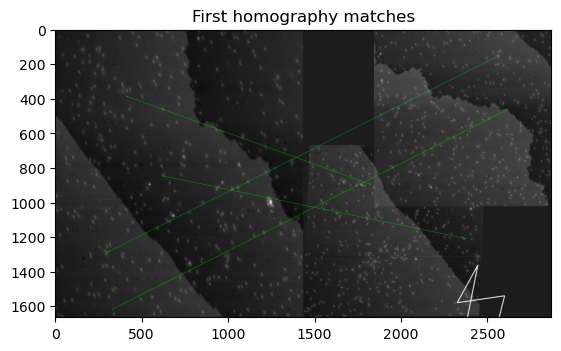

2


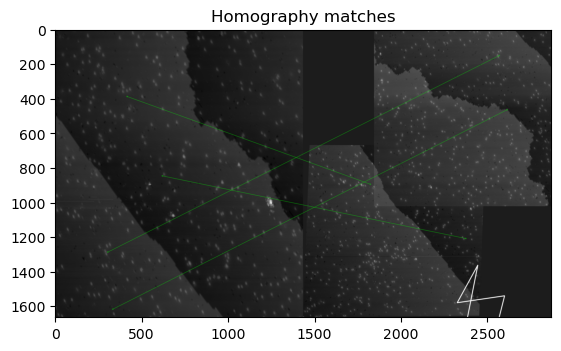

In [508]:
homography1 = find_homography(scans[(0,2)].retrace_down_proc,stitch1,threshold = 1, show_plot=True)

0
(0, 0) (0, 1)


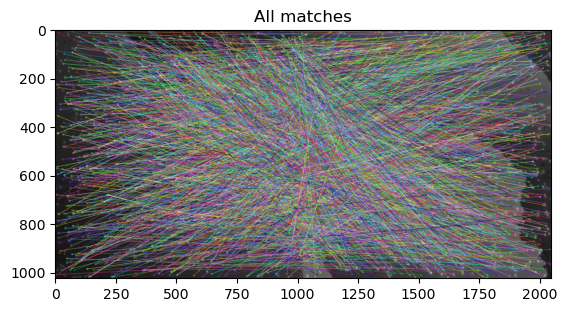

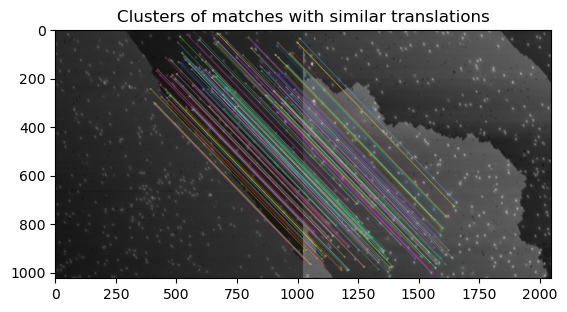

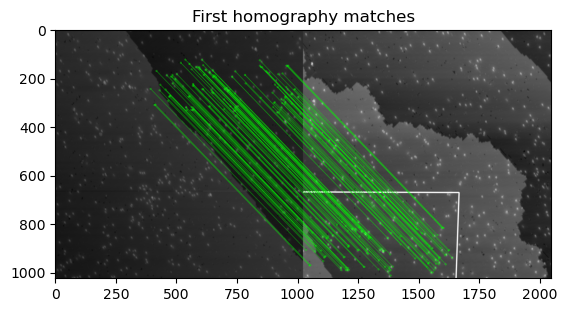

2


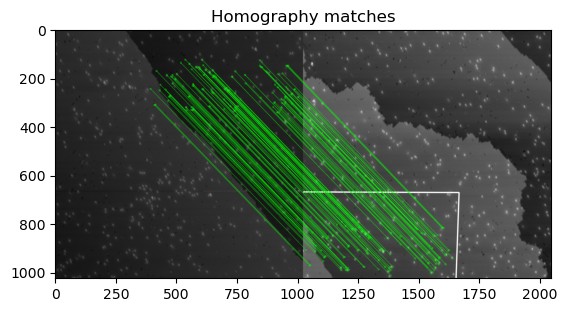

1
(0, 1) (0, 2)


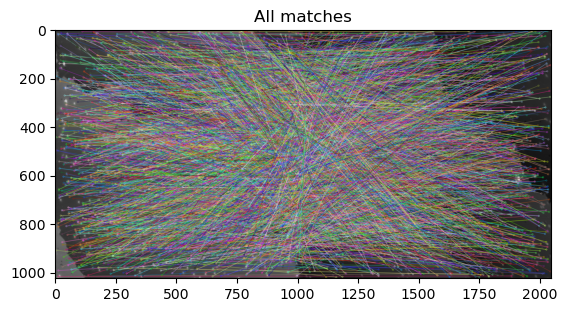

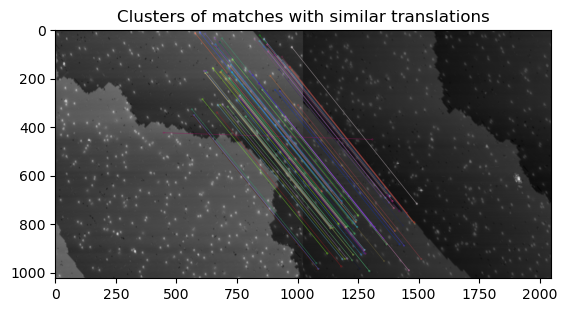

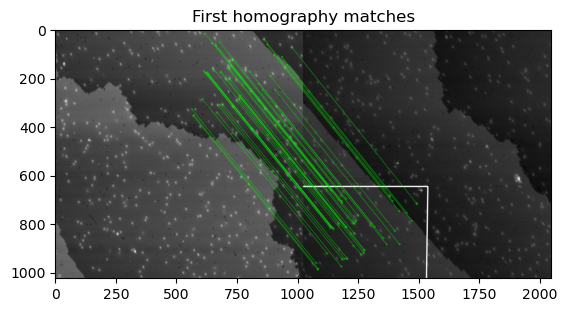

2


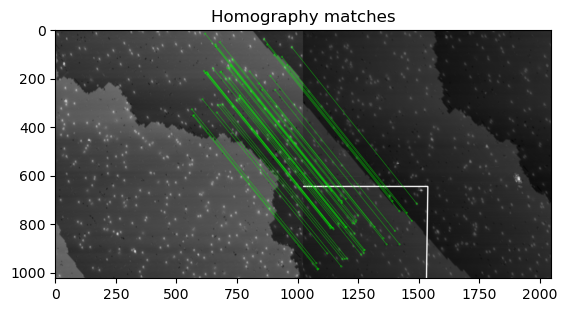

2
(0, 2) (0, 3)


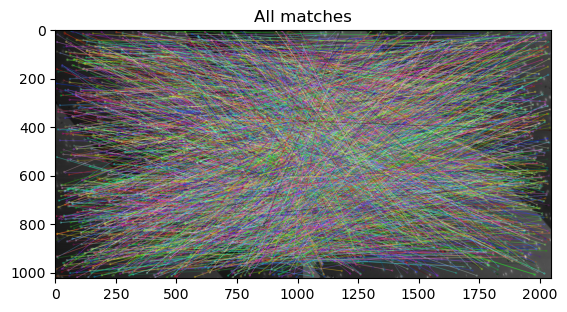

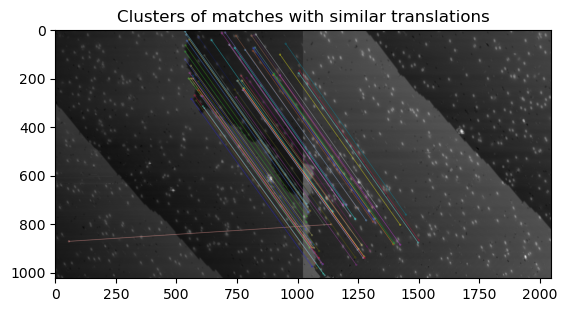

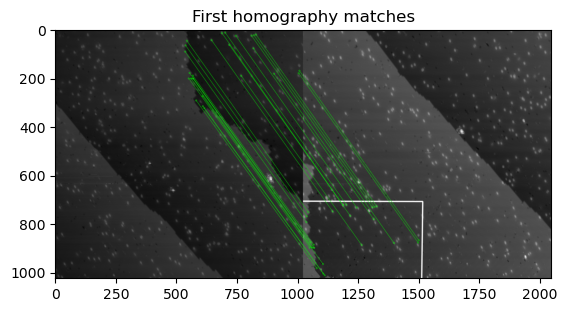

2


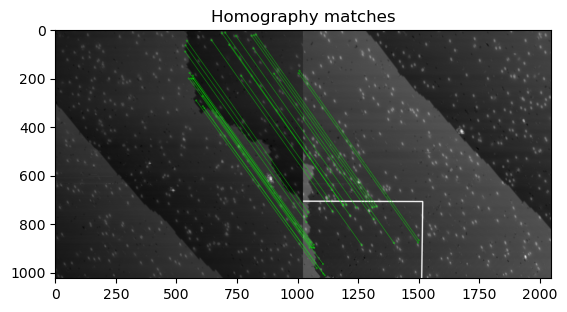

3
(0, 3) (0, 4)


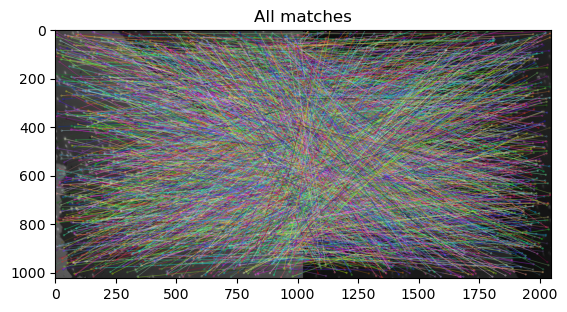

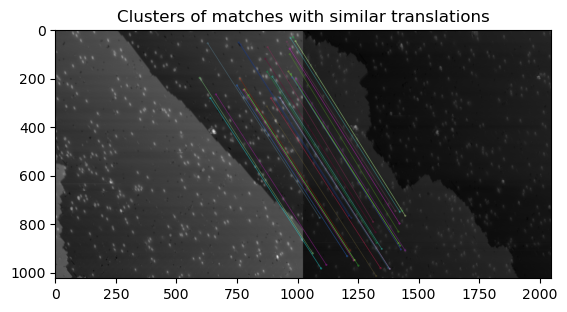

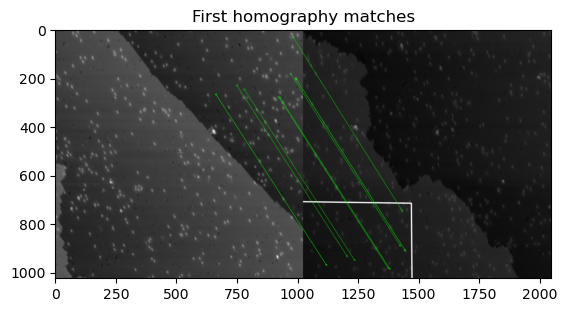

2


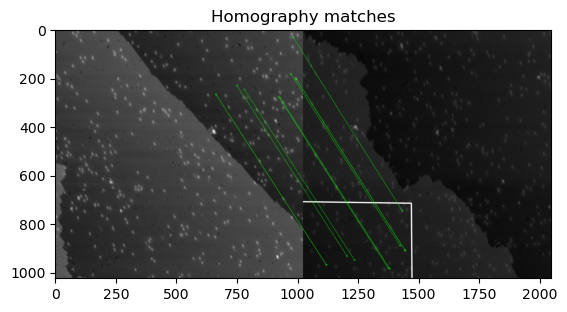

4
(0, 4) (0, 5)
Unexpected exception formatting exception. Falling back to standard exception


Traceback (most recent call last):
  File "c:\Users\nkolev\Anaconda3\envs\pytorch_env\lib\site-packages\IPython\core\interactiveshell.py", line 3505, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "C:\Users\nkolev\AppData\Local\Temp\ipykernel_34044\3668452438.py", line 17, in <module>
    homographies[(key, neighbour_key)] = find_homography(scan.retrace_down_proc, neighbour.retrace_down_proc, threshold=1, show_plot=True)
  File "C:\Users\nkolev\AppData\Local\Temp\ipykernel_34044\3575164774.py", line -1, in find_homography
KeyboardInterrupt

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "c:\Users\nkolev\Anaconda3\envs\pytorch_env\lib\site-packages\IPython\core\interactiveshell.py", line 2102, in showtraceback
    stb = self.InteractiveTB.structured_traceback(
  File "c:\Users\nkolev\Anaconda3\envs\pytorch_env\lib\site-packages\IPython\core\ultratb.py", line 1310, in structured_traceback
    return

In [497]:
# Find overlaps and homography matrices. Start with (0,0) and (0,1), then (0,2) etc

homographies = {}

i=0
for key, scan in scans.items():
    print(i)
    #if i==5 or i==6 or i ==11 or i==14 or i==20 or i ==21 or i ==24 or i ==30:
    if i>-1:
        neighbour_key = (key[0], key[1]+1)
        print(key, neighbour_key)
        if neighbour_key[1]>5:
            continue
        if neighbour_key not in scans:
            continue
        neighbour = scans[neighbour_key]
        homographies[(key, neighbour_key)] = find_homography(scan.retrace_down_proc, neighbour.retrace_down_proc, threshold=1, show_plot=True)
    i+=1
    #if i==1:
    #    break 